In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import logging

In [2]:
import anndata

In [3]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
sc.logging.print_versions()

-----
anndata     0.7.4
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 7.2.0
anndata             0.7.4
appnope             0.1.0
backcall            0.2.0
cairo               1.19.1
cffi                1.14.0
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.2
get_version         2.1
h5py                2.10.0
igraph              0.8.2
ipykernel           5.3.3
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.17.2
joblib              0.16.0
kiwisolver          1.2.0
legacy_api_wrap     1.2
leidenalg           0.8.1
llvmlite            0.33.0
louvain             0.6.1
matplotlib          3.3.0
mpl_toolkits        NA
natsort             7.0.1
numba               0.50.1
numexpr             2.7.1
numpy               1.19.0
packaging           20.4
pandas              1.0.5
parso               0.7.0
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources       NA
prompt_toolkit      3.0.5
psu

In [4]:
from matplotlib import colors
# color_map
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [5]:
sc.logging.print_version_and_date()

Running Scanpy 1.6.0, on 2020-09-21 11:29.


In [6]:
sc.settings.set_figure_params(dpi=80)

In [7]:
import os

# get the pe'er data in 

### fastqs have been reprocessed as described in nowotschin_reprocessing_scripts

In [18]:
base_dir = "/Users/LoboM/Dropbox/shared_Bioinformatics/tenX/peer_data/"
ext_dir = "/outs/filtered_feature_bc_matrix/"

In [10]:
os.listdir(base_dir)

['E8_75_Posterior_gut__GSM3494362',
 'E8_75_Anterior_gut__GSM3494359',
 'E8_75_Anterior_gut__GSM3494360',
 '.DS_Store',
 'E5_5_Whole_embryo__GSM3494338',
 'E6_5_Visceral_and_parietal_endoderm__GSM3494342',
 'E5_5_Whole_embryo__GSM3494339',
 'E8_75_Definitive_endoderm__GFP-__GSM3494357',
 'E4_5_Whole_embryo__GSM3494336',
 'E8_75_Definitive_endoderm__GFP-__GSM3494358',
 'E5_5_Whole_embryo__GSM3494340',
 'E8_75_Visceral_endoderm__GFPpos__GSM3494356',
 'E4_5_Whole_embryo__GSM3494337',
 'E7_5_Visceral_endoderm__GFPpos__GSM3494347',
 'E7_5_Definitive_endoderm__GFP-__GSM3494349',
 'E7_5_Visceral_endoderm__GFPpos__GSM3494346',
 'E7_5_Definitive_endoderm__GFP-__GSM3494348',
 'README',
 'E8_75_Posterior_gut__GSM3494361',
 'E7_5_Definitive_endoderm__GFP-__GSM3494350',
 'E6_5_Visceral_and_parietal_endoderm__GSM3494341',
 'files',
 'E8_75_Visceral_endoderm__GFPpos__GSM3494355',
 'E3_5_Whole_embryo__GSM3494334',
 'E7_5_Visceral_endoderm__GFPpos__GSM3494345',
 'E3_5_Whole_embryo__GSM3494335']

In [15]:
samples = [entry for entry in os.listdir(base_dir) if ('Parietal_endoderm' not in entry) and ('Yolk_sac_endoderm' not in entry) and (entry not in ['README','files','.DS_Store'])]

In [16]:
samples.sort()
samples

['E3_5_Whole_embryo__GSM3494334',
 'E3_5_Whole_embryo__GSM3494335',
 'E4_5_Whole_embryo__GSM3494336',
 'E4_5_Whole_embryo__GSM3494337',
 'E5_5_Whole_embryo__GSM3494338',
 'E5_5_Whole_embryo__GSM3494339',
 'E5_5_Whole_embryo__GSM3494340',
 'E6_5_Visceral_and_parietal_endoderm__GSM3494341',
 'E6_5_Visceral_and_parietal_endoderm__GSM3494342',
 'E7_5_Definitive_endoderm__GFP-__GSM3494348',
 'E7_5_Definitive_endoderm__GFP-__GSM3494349',
 'E7_5_Definitive_endoderm__GFP-__GSM3494350',
 'E7_5_Visceral_endoderm__GFPpos__GSM3494345',
 'E7_5_Visceral_endoderm__GFPpos__GSM3494346',
 'E7_5_Visceral_endoderm__GFPpos__GSM3494347',
 'E8_75_Anterior_gut__GSM3494359',
 'E8_75_Anterior_gut__GSM3494360',
 'E8_75_Definitive_endoderm__GFP-__GSM3494357',
 'E8_75_Definitive_endoderm__GFP-__GSM3494358',
 'E8_75_Posterior_gut__GSM3494361',
 'E8_75_Posterior_gut__GSM3494362',
 'E8_75_Visceral_endoderm__GFPpos__GSM3494355',
 'E8_75_Visceral_endoderm__GFPpos__GSM3494356']

In [17]:
def load_scRNA(dir_name, sample_name):
    # this function takes dirname containing tsv, mtx files and generates Anndata object
    
    assert os.path.exists(dir_name), "mRNA directory {} does not exist".format(dir_name)
    
    adata_r1 = sc.read_10x_mtx(dir_name,cache=True)
    adata_r1.obs['sample'] = [sample_name]*adata_r1.n_obs
    #adata_r1.obs['original_day'] =  ['.'.join(sample_name.split('_')[0:2])]*adata_r1.n_obs
    
    return adata_r1

In [19]:
adata = {}
for entry in samples:
    print(base_dir + entry + ext_dir,entry)
    adata[entry] = load_scRNA(base_dir + entry + ext_dir,entry)

/Users/LoboM/Dropbox/shared_Bioinformatics/tenX/peer_data/E3_5_Whole_embryo__GSM3494334/outs/filtered_feature_bc_matrix/ E3_5_Whole_embryo__GSM3494334
... writing an h5ad cache file to speedup reading next time
/Users/LoboM/Dropbox/shared_Bioinformatics/tenX/peer_data/E3_5_Whole_embryo__GSM3494335/outs/filtered_feature_bc_matrix/ E3_5_Whole_embryo__GSM3494335
... writing an h5ad cache file to speedup reading next time
/Users/LoboM/Dropbox/shared_Bioinformatics/tenX/peer_data/E4_5_Whole_embryo__GSM3494336/outs/filtered_feature_bc_matrix/ E4_5_Whole_embryo__GSM3494336
... writing an h5ad cache file to speedup reading next time
/Users/LoboM/Dropbox/shared_Bioinformatics/tenX/peer_data/E4_5_Whole_embryo__GSM3494337/outs/filtered_feature_bc_matrix/ E4_5_Whole_embryo__GSM3494337
... writing an h5ad cache file to speedup reading next time
/Users/LoboM/Dropbox/shared_Bioinformatics/tenX/peer_data/E5_5_Whole_embryo__GSM3494338/outs/filtered_feature_bc_matrix/ E5_5_Whole_embryo__GSM3494338
... w

add metadata to DP
remove non endodermal
create sub-object without VE, prE cells

In [21]:
adata

{'E3_5_Whole_embryo__GSM3494334': AnnData object with n_obs × n_vars = 595 × 31053
     obs: 'sample'
     var: 'gene_ids', 'feature_types',
 'E3_5_Whole_embryo__GSM3494335': AnnData object with n_obs × n_vars = 1359 × 31053
     obs: 'sample'
     var: 'gene_ids', 'feature_types',
 'E4_5_Whole_embryo__GSM3494336': AnnData object with n_obs × n_vars = 682 × 31053
     obs: 'sample'
     var: 'gene_ids', 'feature_types',
 'E4_5_Whole_embryo__GSM3494337': AnnData object with n_obs × n_vars = 1010 × 31053
     obs: 'sample'
     var: 'gene_ids', 'feature_types',
 'E5_5_Whole_embryo__GSM3494338': AnnData object with n_obs × n_vars = 3597 × 31053
     obs: 'sample'
     var: 'gene_ids', 'feature_types',
 'E5_5_Whole_embryo__GSM3494339': AnnData object with n_obs × n_vars = 10012 × 31053
     obs: 'sample'
     var: 'gene_ids', 'feature_types',
 'E5_5_Whole_embryo__GSM3494340': AnnData object with n_obs × n_vars = 6543 × 31053
     obs: 'sample'
     var: 'gene_ids', 'feature_types',
 'E6_5_

In [22]:
numcells = 0
for entry in adata:
    numcells = numcells + adata[entry].shape[0]
print(numcells)

122520


In [27]:
adata_dp = adata['E3_5_Whole_embryo__GSM3494334']
for entry in adata:
    if entry != 'E3_5_Whole_embryo__GSM3494334':
        adata_dp = adata_dp.concatenate(adata[entry])

In [29]:
adata_dp.obs

,sample,batch
AAACCTGCACTAGTAC-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,0
AAACCTGTCTCACATT-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,0
AAACGGGCACACCGCA-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,0
AAACGGGGTGTAATGA-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,0
AAAGCAAAGTAGGTGC-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,0
...,...,...
TTTGTCATCACCATAG-1-1,E8_75_Visceral_endoderm__GFPpos__GSM3494356,1
TTTGTCATCACCCGAG-1-1,E8_75_Visceral_endoderm__GFPpos__GSM3494356,1
TTTGTCATCTAACCGA-1-1,E8_75_Visceral_endoderm__GFPpos__GSM3494356,1
TTTGTCATCTTCCTTC-1-1,E8_75_Visceral_endoderm__GFPpos__GSM3494356,1


 - Pe'er QC
read Pe'er's object and filter all cells not in that object

In [32]:
adata_dp

AnnData object with n_obs × n_vars = 122520 × 31053
    obs: 'sample', 'batch'
    var: 'gene_ids', 'feature_types'

In [33]:
adata_dp_online = sc.read("../mouse_endoderm_roadmap/data/nowotschin/sc_endoderm_all_cells.h5ad")

In [47]:
set_pref = []
for entry in adata_dp_online.obs.index:
    set_pref.append('_'.join(entry.split('_')[0:-1]))
set(set_pref)

{'E85anterior2A',
 'E85anterior2B',
 'E85posterior2A',
 'E85posterior2B',
 'Lib1-1_E4.5',
 'Lib1-2_E4.5',
 'Lib1-3_E3.5',
 'Lib1-4_E3.5',
 'Lib11-1_E8.5_GFP+',
 'Lib11-2_E8.5_GFP+',
 'Lib12-1_E8.5_GFP-',
 'Lib12-2_E8.5_GFP-',
 'Lib2-1_E5.5',
 'Lib2-2_E5.5',
 'Lib2-3_E5.5',
 'Lib3-1_E6.5',
 'Lib3-2_E6.5',
 'Lib4-1_E7.5_ParE',
 'Lib4-2_E7.5_ParE',
 'Lib5-1_E7.5_GFP+',
 'Lib5-2_E7.5_GFP+',
 'Lib5-3_E7.5_GFP+',
 'Lib6-1_E7.5_GFP-',
 'Lib6-2_E7.5_GFP-',
 'Lib6-3_E7.5_GFP-',
 'Lib7-1_E8.5_ParE',
 'Lib7-2_E8.5_ParE',
 'Lib8-1_E8.5_YsE',
 'Lib8-2_E8.5_YsE'}

In [36]:
# mt genes
for entry in adata_dp.var_names:
    if 'mt-' in entry:
        print(entry)

mt-Nd1
mt-Nd2
mt-Co1
mt-Co2
mt-Atp8
mt-Atp6
mt-Co3
mt-Nd3
mt-Nd4l
mt-Nd4
mt-Nd5
mt-Nd6
mt-Cytb


In [37]:
adata_dp.var['mt'] = adata_dp.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_dp, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [39]:
adata_dp.write("../data/nowotschin_noparE_yse_pre_qc.h5ad")

... storing 'sample' as categorical
... storing 'feature_types' as categorical


In [42]:
plt.rcParams['figure.figsize']=(16,16)

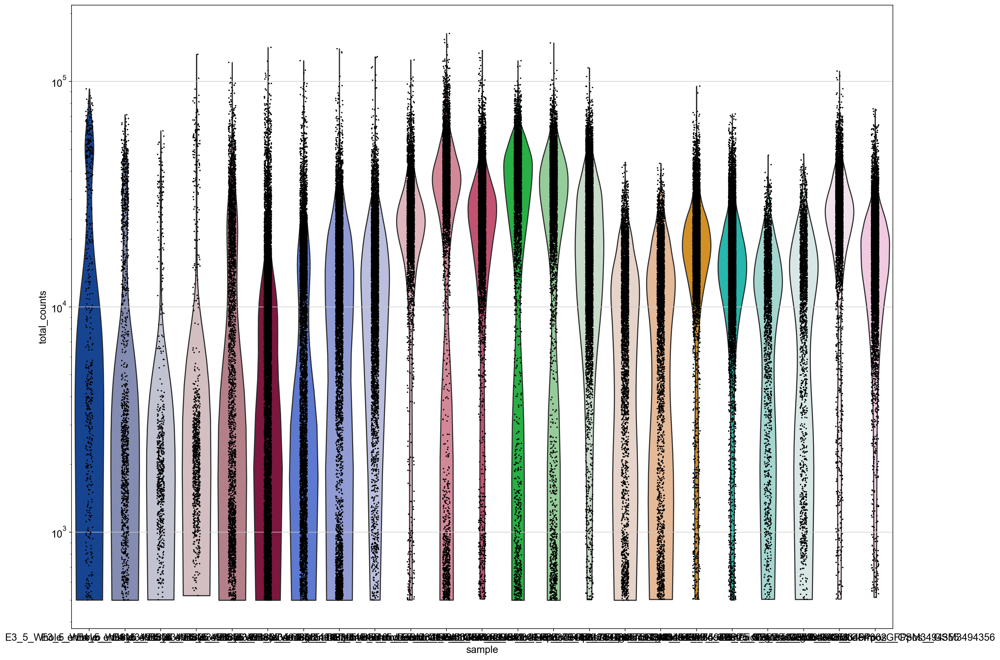

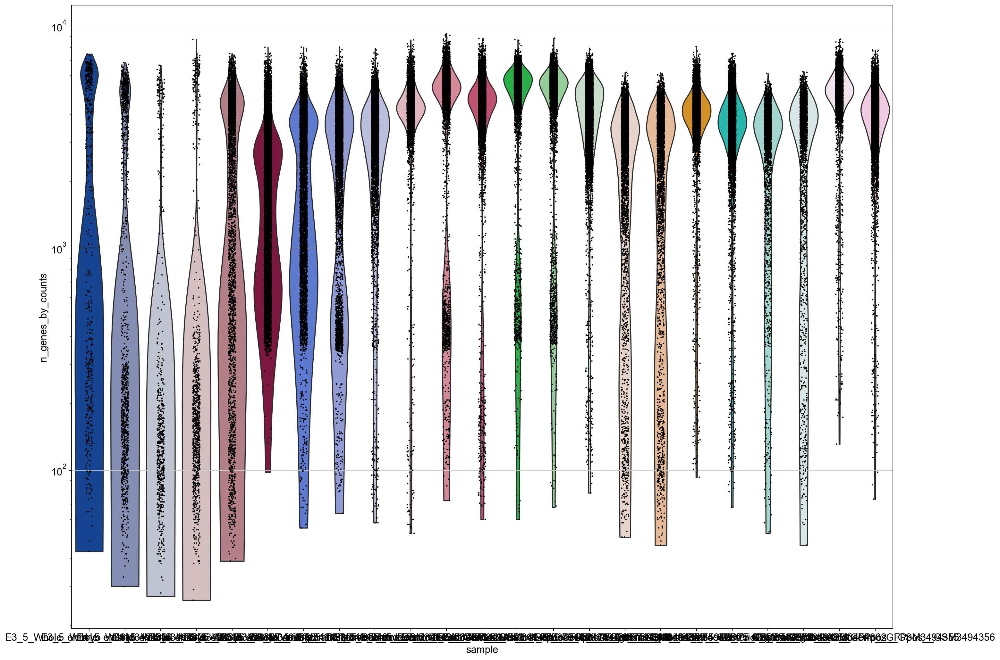

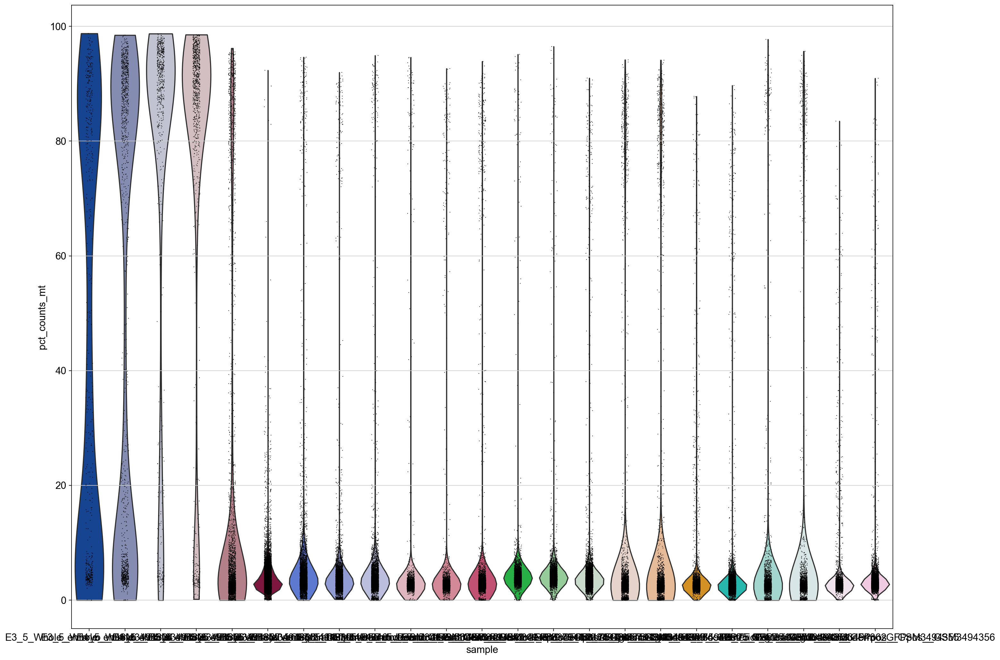

In [43]:
t1 = sc.pl.violin(adata_dp, 'total_counts', groupby='sample', order=samples,size=2, log=True, cut=0,save='_dp_umi_counts.png')
t2 = sc.pl.violin(adata_dp, 'n_genes_by_counts', groupby='sample',order=samples, size=2, log=True, cut=0,save='_dp_genes.png')
t3 = sc.pl.violin(adata_dp, 'pct_counts_mt', groupby='sample',order=samples,save='_dp_mt_counts.png')

In [62]:
gsm_info = {}
with open(base_dir + "GSM_info","r") as f:
    for entry in f:
        entry = entry.strip().split("_")[0:-1]
        val = '_'.join(entry[1:])
        val = val.replace('E8.75','E8.5')
        if val in ['E8.5_anterior_Rep1','E8.5_anterior_Rep2', 'E8.5_posterior_Rep1', 'E8.5_posterior_Rep2']:
            val = val.replace('.','').replace('Rep1','2A').replace('Rep2','2B').replace('_','')
        gsm_info[entry[0]] =val

In [63]:
gsm_info

{'GSM3494334': 'Lib1-3_E3.5',
 'GSM3494335': 'Lib1-4_E3.5',
 'GSM3494336': 'Lib1-1_E4.5',
 'GSM3494337': 'Lib1-2_E4.5',
 'GSM3494338': 'Lib2-1_E5.5',
 'GSM3494339': 'Lib2-2_E5.5',
 'GSM3494340': 'Lib2-3_E5.5',
 'GSM3494341': 'Lib3-1_E6.5',
 'GSM3494342': 'Lib3-2_E6.5',
 'GSM3494343': 'Lib4-1_E7.5_ParE',
 'GSM3494344': 'Lib4-2_E7.5_ParE',
 'GSM3494345': 'Lib5-1_E7.5_GFP+',
 'GSM3494346': 'Lib5-2_E7.5_GFP+',
 'GSM3494347': 'Lib5-3_E7.5_GFP+',
 'GSM3494348': 'Lib6-1_E7.5_GFP-',
 'GSM3494349': 'Lib6-2_E7.5_GFP-',
 'GSM3494350': 'Lib6-3_E7.5_GFP-',
 'GSM3494351': 'Lib7-1_E8.5_ParE',
 'GSM3494352': 'Lib7-2_E8.5_ParE',
 'GSM3494353': 'Lib8-1_E8.5_YsE',
 'GSM3494354': 'Lib8-2_E8.5_YsE',
 'GSM3494355': 'Lib11-1_E8.5_GFP+',
 'GSM3494356': 'Lib11-2_E8.5_GFP+',
 'GSM3494357': 'Lib12-1_E8.5_GFP-',
 'GSM3494358': 'Lib12-2_E8.5_GFP-',
 'GSM3494359': 'E85anterior2A',
 'GSM3494360': 'E85anterior2B',
 'GSM3494361': 'E85posterior2A',
 'GSM3494362': 'E85posterior2B'}

In [67]:
dp_info = []
for entry in adata_dp.obs['sample'].values:
    entry = entry.split('_')[-1]
    dp_info.append(gsm_info[entry])

In [68]:
set(dp_info)

{'E85anterior2A',
 'E85anterior2B',
 'E85posterior2A',
 'E85posterior2B',
 'Lib1-1_E4.5',
 'Lib1-2_E4.5',
 'Lib1-3_E3.5',
 'Lib1-4_E3.5',
 'Lib11-1_E8.5_GFP+',
 'Lib11-2_E8.5_GFP+',
 'Lib12-1_E8.5_GFP-',
 'Lib12-2_E8.5_GFP-',
 'Lib2-1_E5.5',
 'Lib2-2_E5.5',
 'Lib2-3_E5.5',
 'Lib3-1_E6.5',
 'Lib3-2_E6.5',
 'Lib5-1_E7.5_GFP+',
 'Lib5-2_E7.5_GFP+',
 'Lib5-3_E7.5_GFP+',
 'Lib6-1_E7.5_GFP-',
 'Lib6-2_E7.5_GFP-',
 'Lib6-3_E7.5_GFP-'}

In [69]:
len(dp_info)

122520

In [70]:
adata_dp.obs['dp_info'] = dp_info

In [71]:

adata_dp.obs

,sample,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,dp_info
AAACCTGCACTAGTAC-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,0,1809,6634.0,3063.0,46.171238,Lib1-3_E3.5
AAACCTGTCTCACATT-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,0,6117,58537.0,2815.0,4.808924,Lib1-3_E3.5
AAACGGGCACACCGCA-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,0,639,2596.0,1614.0,62.172573,Lib1-3_E3.5
AAACGGGGTGTAATGA-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,0,108,1400.0,1285.0,91.785721,Lib1-3_E3.5
AAAGCAAAGTAGGTGC-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,0,6023,54291.0,2209.0,4.068814,Lib1-3_E3.5
...,...,...,...,...,...,...,...
TTTGTCATCACCATAG-1-1,E8_75_Visceral_endoderm__GFPpos__GSM3494356,1,4437,18764.0,546.0,2.909827,Lib11-2_E8.5_GFP+
TTTGTCATCACCCGAG-1-1,E8_75_Visceral_endoderm__GFPpos__GSM3494356,1,4196,17306.0,391.0,2.259332,Lib11-2_E8.5_GFP+
TTTGTCATCTAACCGA-1-1,E8_75_Visceral_endoderm__GFPpos__GSM3494356,1,3252,10053.0,328.0,3.262708,Lib11-2_E8.5_GFP+
TTTGTCATCTTCCTTC-1-1,E8_75_Visceral_endoderm__GFPpos__GSM3494356,1,2355,5817.0,116.0,1.994155,Lib11-2_E8.5_GFP+


In [72]:
adata_dp_online

AnnData object with n_obs × n_vars = 113051 × 20897
    obs: 'Cluster', 'Timepoint', 'CellType'

In [81]:
info = []
for entry in adata_dp_online.obs.index:
    info.append('_'.join(entry.split('_')[0:-1]))
adata_dp_online.obs['info'] = info

In [84]:
yse_pare = []
for entry in adata_dp_online.obs['info'].value_counts().index:
    if ('ParE' in entry) or ('YsE' in entry):
        yse_pare.append(entry)

In [85]:
yse_pare

['Lib7-1_E8.5_ParE',
 'Lib7-2_E8.5_ParE',
 'Lib8-1_E8.5_YsE',
 'Lib8-2_E8.5_YsE',
 'Lib4-2_E7.5_ParE',
 'Lib4-1_E7.5_ParE']

In [86]:
adata_dp_online_no_yse_pare = adata_dp_online[~adata_dp_online.obs['info'].isin(yse_pare)]

In [87]:
adata_dp_online_no_yse_pare.obs['info'].value_counts()

Lib12-2_E8.5_GFP-    10812
Lib5-3_E7.5_GFP+      8717
Lib11-2_E8.5_GFP+     8202
Lib6-3_E7.5_GFP-      6723
Lib12-1_E8.5_GFP-     6449
Lib2-2_E5.5           5631
Lib11-1_E8.5_GFP+     5394
Lib5-2_E7.5_GFP+      5007
Lib3-1_E6.5           4779
Lib3-2_E6.5           4465
Lib5-1_E7.5_GFP+      4085
Lib2-3_E5.5           3824
Lib6-2_E7.5_GFP-      3793
Lib6-1_E7.5_GFP-      3426
Lib2-1_E5.5           2095
E85posterior2A        1887
E85anterior2A         1804
E85posterior2B        1780
E85anterior2B         1775
Lib1-4_E3.5            528
Lib1-3_E3.5            246
Lib1-2_E4.5            136
Lib1-1_E4.5             96
Name: info, dtype: int64

In [89]:
adata_dp_online_no_yse_pare.obs

,Cluster,Timepoint,CellType,info
index,,,,
E85anterior2A_TTTATGCTCGGATGGA,E8.75_ap: 0,E8.75_ap,Mes,E85anterior2A
E85anterior2A_TTTATGCTCCTAGGGC,E8.75_ap: 0,E8.75_ap,Mes,E85anterior2A
E85anterior2A_TTTATGCTCCAACCAA,E8.75_ap:2,E8.75,Gut tube,E85anterior2A
E85anterior2A_TTTATGCAGTGGGTTG,E8.75_ap: 8,E8.75_ap,Mes,E85anterior2A
E85anterior2A_TTTACTGTCGGAGGTA,E8.75_ap:3,E8.75,Gut tube,E85anterior2A
...,...,...,...,...
Lib6-3_E7.5_GFP-_CCCAGTTAGCTGTCTA,E7.5: 5,E7.5,Mes,Lib6-3_E7.5_GFP-
Lib6-3_E7.5_GFP-_CCCAGTTGTTCAGCGC,E7.5: 3,E7.5,DE,Lib6-3_E7.5_GFP-
Lib6-3_E7.5_GFP-_CCCAGTTCATACGCTA,E7.5: 5,E7.5,Mes,Lib6-3_E7.5_GFP-


In [75]:
len(adata_dp.var_names)

31053

In [76]:
len(set(adata_dp.var_names))

31053

In [110]:
Cluster = []
Timepoint = []
CellType = []
in_online_obj = []
pre_name = []
for entry in adata_dp.obs.index:
    info = adata_dp[entry,:].obs['dp_info'].values[0]
    prev_name = info + '_' + entry.split('-')[0]
    pre_name.append(prev_name)
    if prev_name not in adata_dp_online_no_yse_pare.obs.index:
        Cluster.append('-')
        Timepoint.append('-')
        CellType.append('-')
        in_online_obj.append(0)
    else:
        Timepoint.append(adata_dp_online_no_yse_pare[prev_name,:].obs['Timepoint'].values[0])
        CellType.append(adata_dp_online_no_yse_pare[prev_name,:].obs['CellType'].values[0])
        Cluster.append(adata_dp_online_no_yse_pare[prev_name,:].obs['Cluster'].values[0])
        in_online_obj.append(1)

In [99]:
adata_dp[['AAACCTGCACTAGTAC-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0'],:].obs

,sample,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,dp_info
AAACCTGCACTAGTAC-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,0,1809,6634.0,3063.0,46.171238,Lib1-3_E3.5


In [101]:
Cluster

['-', 'E3.5:0', '-', '-', 'E3.5:1']

In [102]:
Timepoint

['-', 'E3.5', '-', '-', 'E3.5']

In [103]:
CellType

['-', nan, '-', '-', nan]

In [104]:
in_online_obj

[0, 1, 0, 0, 1]

In [111]:
len(Timepoint)

122520

In [112]:
adata_dp.obs['Timepoint'] = Timepoint
adata_dp.obs['CellType'] = CellType
adata_dp.obs['Cluster'] = Cluster
adata_dp.obs['in_online_obj'] = in_online_obj
adata_dp.obs['old_name'] = pre_name

In [113]:
adata_dp[adata_dp.obs['in_online_obj']==1]

View of AnnData object with n_obs × n_vars = 91635 × 31053
    obs: 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'dp_info', 'Timepoint', 'CellType', 'Cluster', 'in_online_obj', 'old_name'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors'

In [116]:
adata_dp[adata_dp.obs['old_name'].isin(adata_dp_online_no_yse_pare.obs.index)]

View of AnnData object with n_obs × n_vars = 91635 × 31053
    obs: 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'dp_info', 'Timepoint', 'CellType', 'Cluster', 'in_online_obj', 'old_name'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors'

In [134]:
adata_dp_online_no_yse_pare

View of AnnData object with n_obs × n_vars = 91654 × 20897
    obs: 'Cluster', 'Timepoint', 'CellType', 'info'

In [120]:
set(adata_dp_online_no_yse_pare.obs.index) - set(adata_dp.obs['old_name'].values)

{'Lib1-3_E3.5_TACTTACAGGCAGGTT',
 'Lib11-1_E8.5_GFP+_CACCTTGCACGGTAGA',
 'Lib11-1_E8.5_GFP+_TTTACTGAGCTGTCTA',
 'Lib11-2_E8.5_GFP+_GGCGACTTCGATAGAA',
 'Lib12-2_E8.5_GFP-_CATCAGAAGCCTATGT',
 'Lib12-2_E8.5_GFP-_TTTCCTCTCGAGAGCA',
 'Lib2-1_E5.5_CGCTTCATCCGTACAA',
 'Lib2-1_E5.5_GCGCGATAGAAACGCC',
 'Lib2-1_E5.5_TACCTTAAGGGTCGAT',
 'Lib2-3_E5.5_AAAGTAGAGTGTACCT',
 'Lib2-3_E5.5_CCATTCGAGCCAGTAG',
 'Lib2-3_E5.5_GCAATCACAGACAAGC',
 'Lib2-3_E5.5_TGTCCCACATCGGAAG',
 'Lib6-2_E7.5_GFP-_AGCGGTCAGAGCCCAA',
 'Lib6-2_E7.5_GFP-_AGTGAGGCATCACAAC',
 'Lib6-2_E7.5_GFP-_CAACTAGGTGTGAAAT',
 'Lib6-2_E7.5_GFP-_CGAGCACGTGACTCAT',
 'Lib6-2_E7.5_GFP-_GTGCATATCCCGGATG',
 'Lib6-2_E7.5_GFP-_TACCTTACAGTCGTGC'}

In [123]:
del adata_dp.obs['batch']

In [125]:
adata_dp.obs['dp_info'].value_counts()

Lib12-2_E8.5_GFP-    12246
Lib5-3_E7.5_GFP+     10717
Lib2-2_E5.5          10012
Lib11-2_E8.5_GFP+     8909
Lib6-3_E7.5_GFP-      7311
Lib3-1_E6.5           7226
Lib12-1_E8.5_GFP-     7176
Lib2-3_E5.5           6543
Lib3-2_E6.5           6342
Lib5-2_E7.5_GFP+      5833
Lib11-1_E8.5_GFP+     5824
Lib6-2_E7.5_GFP-      5308
Lib5-1_E7.5_GFP+      4538
Lib6-1_E7.5_GFP-      4531
E85anterior2A         3971
E85anterior2B         3757
Lib2-1_E5.5           3597
E85posterior2A        2578
E85posterior2B        2455
Lib1-4_E3.5           1359
Lib1-2_E4.5           1010
Lib1-1_E4.5            682
Lib1-3_E3.5            595
Name: dp_info, dtype: int64

- NOTE: some (19) cells from aren't in rerun; also I filtered whatever Pe'er filterd for my QC

In [138]:
adata_dp_tmp1 = adata_dp[adata_dp.obs['in_online_obj']==0]

In [140]:
adata_dp_tmp1.obs

,sample,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,dp_info,Timepoint,CellType,Cluster,in_online_obj,old_name
AAACCTGCACTAGTAC-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,1809,6634.0,3063.0,46.171238,Lib1-3_E3.5,-,-,-,0,Lib1-3_E3.5_AAACCTGCACTAGTAC
AAACGGGCACACCGCA-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,639,2596.0,1614.0,62.172573,Lib1-3_E3.5,-,-,-,0,Lib1-3_E3.5_AAACGGGCACACCGCA
AAACGGGGTGTAATGA-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,108,1400.0,1285.0,91.785721,Lib1-3_E3.5,-,-,-,0,Lib1-3_E3.5_AAACGGGGTGTAATGA
AAAGTAGGTAACGTTC-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,2318,9926.0,3699.0,37.265766,Lib1-3_E3.5,-,-,-,0,Lib1-3_E3.5_AAAGTAGGTAACGTTC
AAAGTAGGTCGTGGCT-1-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0-0,E3_5_Whole_embryo__GSM3494334,197,3970.0,3762.0,94.760704,Lib1-3_E3.5,-,-,-,0,Lib1-3_E3.5_AAAGTAGGTCGTGGCT
...,...,...,...,...,...,...,...,...,...,...,...
TTTGCGCTCATGTCCC-1-1,E8_75_Visceral_endoderm__GFPpos__GSM3494356,6754,46080.0,1096.0,2.378472,Lib11-2_E8.5_GFP+,-,-,-,0,Lib11-2_E8.5_GFP+_TTTGCGCTCATGTCCC
TTTGGTTTCATGGTCA-1-1,E8_75_Visceral_endoderm__GFPpos__GSM3494356,6489,49694.0,946.0,1.903650,Lib11-2_E8.5_GFP+,-,-,-,0,Lib11-2_E8.5_GFP+_TTTGGTTTCATGGTCA
TTTGGTTTCTTGTTTG-1-1,E8_75_Visceral_endoderm__GFPpos__GSM3494356,6246,40178.0,776.0,1.931405,Lib11-2_E8.5_GFP+,-,-,-,0,Lib11-2_E8.5_GFP+_TTTGGTTTCTTGTTTG
TTTGTCACAGACTCGC-1-1,E8_75_Visceral_endoderm__GFPpos__GSM3494356,6180,44422.0,1266.0,2.849939,Lib11-2_E8.5_GFP+,-,-,-,0,Lib11-2_E8.5_GFP+_TTTGTCACAGACTCGC


- remove not in post-QC online object

In [146]:
adata_dp_trunc = adata_dp[adata_dp.obs['in_online_obj'] == 1]

In [147]:
adata_dp_trunc

View of AnnData object with n_obs × n_vars = 91635 × 31053
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'dp_info', 'Timepoint', 'CellType', 'Cluster', 'in_online_obj', 'old_name'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors'

- remove non endodermal cell types

In [150]:
adata_dp_2 = adata_dp_trunc[~adata_dp_trunc.obs['CellType'].isin(['Midline','Mes','Endothelial','exVE','ParE','YsE','ExE','Blood','TE','GermCells'])]

In [153]:
adata_dp_2.obs['CellType'].value_counts()

EPI                      8773
emVE                     6339
Gut tube:VE:Pancreas     5288
DE                       3554
Gut tube:DE:Thymus       3443
Gut tube:VE:Small int    2700
Gut tube:DE:Lung         2443
Gut tube:VE:Colon        2414
Gut tube                 1823
Gut tube:DE:Thyroid      1255
Gut tube:VE:Liver        1207
Gut tube:VE:Lung          930
Gut tube:DE:Small int     901
Gut tube:DE:Pancreas      511
Gut tube:DE:Liver         190
PrE                       155
Gut tube:VE:Thymus        154
VE                         40
Gut tube:DE:Colon          28
Gut tube:VE:Thyroid        11
Name: CellType, dtype: int64

In [154]:
adata_dp_2

View of AnnData object with n_obs × n_vars = 42856 × 31053
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'dp_info', 'Timepoint', 'CellType', 'Cluster', 'in_online_obj', 'old_name'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors'

In [155]:
adata_dp_2.obs['sample'].value_counts()

E8_75_Visceral_endoderm__GFPpos__GSM3494356        7642
E8_75_Definitive_endoderm__GFP-__GSM3494358        5692
E8_75_Visceral_endoderm__GFPpos__GSM3494355        5062
E5_5_Whole_embryo__GSM3494339                      4048
E8_75_Definitive_endoderm__GFP-__GSM3494357        3079
E5_5_Whole_embryo__GSM3494340                      2950
E7_5_Definitive_endoderm__GFP-__GSM3494350         1903
E7_5_Visceral_endoderm__GFPpos__GSM3494346         1555
E6_5_Visceral_and_parietal_endoderm__GSM3494341    1373
E5_5_Whole_embryo__GSM3494338                      1371
E6_5_Visceral_and_parietal_endoderm__GSM3494342    1340
E7_5_Visceral_endoderm__GFPpos__GSM3494345         1260
E7_5_Definitive_endoderm__GFP-__GSM3494349          981
E7_5_Visceral_endoderm__GFPpos__GSM3494347          954
E7_5_Definitive_endoderm__GFP-__GSM3494348          922
E8_75_Posterior_gut__GSM3494361                     700
E8_75_Posterior_gut__GSM3494362                     663
E3_5_Whole_embryo__GSM3494335                   

In [156]:
adata_dp_2.write("../data/nowotschin_noparE_yse_post_qc_endo_only.h5ad")

/Users/LoboM/miniconda3/envs/sc-tutorial-0720/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'dp_info' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Timepoint' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'CellType' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Cluster' as categorical


- filter out prE, VE cells

- keep epiblast on day 6.5 and 7.5 since mouse has epiblast cells on these days

In [164]:
adata_dp_2.obs['Cluster'].value_counts()

E7.5: 3          3554
E8.75_gfp: 0     3443
E8.75_gfp:3      2763
E8.75_gfp:2      2700
E5.5:0           2685
E8.75_gfp:4      2525
E8.75_gfp:6      2414
E5.5:1           2089
E5.5:2           1958
E7.5:2           1925
E8.75_gfp: 7     1822
E6.5:2           1473
E8.75_gfp: 10    1255
E8.75_gfp:9      1207
E5.5:4           1148
E8.75_ap:2       1134
E7.5: 9           905
E8.75_gfp: 2      901
E8.75_gfp:8       842
E7.5:9            808
E6.5:4            779
E8.75_gfp: 8      621
E5.5:3            489
E6.5: 7           461
E7.5: 13          383
E8.75_ap:6        363
E8.75_gfp: 3      317
E3.5:0            205
E8.75_gfp: 4      194
E8.75_gfp: 9      190
E8.75_ap:3        190
E3.5:1            181
E3.5:2            176
E8.75_gfp:0       154
E8.75_ap:11       136
E8.75_gfp:7        88
E3.5:3             86
E4.5:0             78
E4.5:1             77
E4.5:2             49
E3.5:4             49
E8.75_gfp: 6       28
E8.75_gfp:10       11
Name: Cluster, dtype: int64

In [168]:
adata_dp_2.obs['Cluster'].cat.categories

Index(['E3.5:0', 'E3.5:1', 'E3.5:2', 'E3.5:3', 'E3.5:4', 'E4.5:0', 'E4.5:1',
       'E4.5:2', 'E5.5:0', 'E5.5:1', 'E5.5:2', 'E5.5:3', 'E5.5:4', 'E6.5:2',
       'E6.5:4', 'E6.5: 7', 'E7.5:2', 'E7.5:9', 'E7.5: 3', 'E7.5: 9',
       'E7.5: 13', 'E8.75_ap:2', 'E8.75_ap:3', 'E8.75_ap:6', 'E8.75_ap:11',
       'E8.75_gfp:0', 'E8.75_gfp:2', 'E8.75_gfp:3', 'E8.75_gfp:4',
       'E8.75_gfp:6', 'E8.75_gfp:7', 'E8.75_gfp:8', 'E8.75_gfp:9',
       'E8.75_gfp:10', 'E8.75_gfp: 0', 'E8.75_gfp: 2', 'E8.75_gfp: 3',
       'E8.75_gfp: 4', 'E8.75_gfp: 6', 'E8.75_gfp: 7', 'E8.75_gfp: 8',
       'E8.75_gfp: 9', 'E8.75_gfp: 10'],
      dtype='object')

- remove prE on day 3.5 and 4.5

In [169]:
adata_dp_3 = adata_dp_2[~adata_dp_2.obs['Cluster'].isin(['E3.5:0', 'E4.5:0','E4.5:1','E3.5:4'])]

In [171]:
adata_dp_2

AnnData object with n_obs × n_vars = 42856 × 31053
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'dp_info', 'Timepoint', 'CellType', 'Cluster', 'in_online_obj', 'old_name'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors'

In [172]:
adata_dp_3

View of AnnData object with n_obs × n_vars = 42447 × 31053
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'dp_info', 'Timepoint', 'CellType', 'Cluster', 'in_online_obj', 'old_name'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors'

- remove emVE and VE

In [180]:
adata_dp_4 = adata_dp_3[~adata_dp_3.obs['CellType'].isin(['emVE','VE'])]

In [181]:
adata_dp_4

View of AnnData object with n_obs × n_vars = 36068 × 31053
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'dp_info', 'Timepoint', 'CellType', 'Cluster', 'in_online_obj', 'old_name'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors'

In [182]:
adata_dp_4.obs['dp_info'].value_counts()

Lib11-2_E8.5_GFP+    7642
Lib12-2_E8.5_GFP-    5692
Lib11-1_E8.5_GFP+    5062
Lib2-2_E5.5          3928
Lib12-1_E8.5_GFP-    3079
Lib2-3_E5.5          2754
Lib6-3_E7.5_GFP-     1901
Lib2-1_E5.5          1198
Lib6-2_E7.5_GFP-      981
Lib6-1_E7.5_GFP-      922
E85posterior2A        700
E85posterior2B        663
Lib1-4_E3.5           293
E85anterior2A         243
Lib3-1_E6.5           234
Lib3-2_E6.5           227
E85anterior2B         217
Lib1-3_E3.5           150
Lib5-3_E7.5_GFP+       51
Lib5-2_E7.5_GFP+       43
Lib5-1_E7.5_GFP+       39
Lib1-2_E4.5            27
Lib1-1_E4.5            22
Name: dp_info, dtype: int64

- remove GFP+ i.e. extra embryonic derived

In [183]:
adata_dp_5 = adata_dp_4[~adata_dp_4.obs['dp_info'].isin(['Lib11-2_E8.5_GFP+',
 'Lib11-1_E8.5_GFP+',
 'Lib5-3_E7.5_GFP+',
 'Lib5-2_E7.5_GFP+',
 'Lib5-1_E7.5_GFP+'])]

In [195]:
adata_dp_5.write("../data/nowotschin_noparE_yse_post_qc_endo_DE_only_FINAL_PEER_OBJ.h5ad")

In [197]:
adata_dp_5.obs['sample'].cat.categories

Index(['E3_5_Whole_embryo__GSM3494334', 'E3_5_Whole_embryo__GSM3494335',
       'E4_5_Whole_embryo__GSM3494336', 'E4_5_Whole_embryo__GSM3494337',
       'E5_5_Whole_embryo__GSM3494338', 'E5_5_Whole_embryo__GSM3494339',
       'E5_5_Whole_embryo__GSM3494340',
       'E6_5_Visceral_and_parietal_endoderm__GSM3494341',
       'E6_5_Visceral_and_parietal_endoderm__GSM3494342',
       'E7_5_Definitive_endoderm__GFP-__GSM3494348',
       'E7_5_Definitive_endoderm__GFP-__GSM3494349',
       'E7_5_Definitive_endoderm__GFP-__GSM3494350',
       'E8_75_Anterior_gut__GSM3494359', 'E8_75_Anterior_gut__GSM3494360',
       'E8_75_Definitive_endoderm__GFP-__GSM3494357',
       'E8_75_Definitive_endoderm__GFP-__GSM3494358',
       'E8_75_Posterior_gut__GSM3494361', 'E8_75_Posterior_gut__GSM3494362'],
      dtype='object')

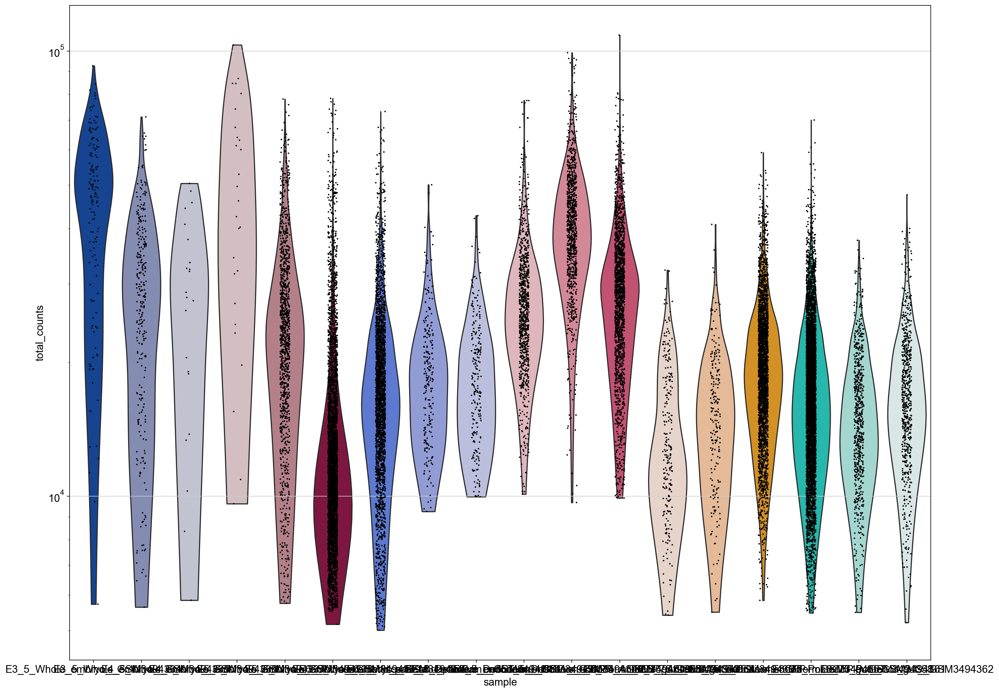

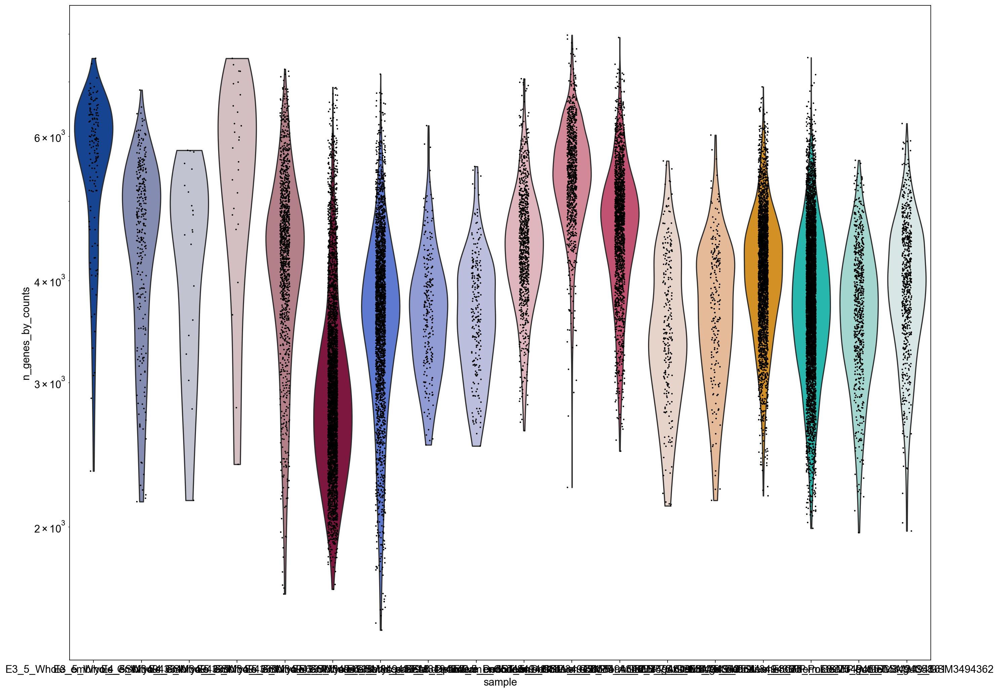

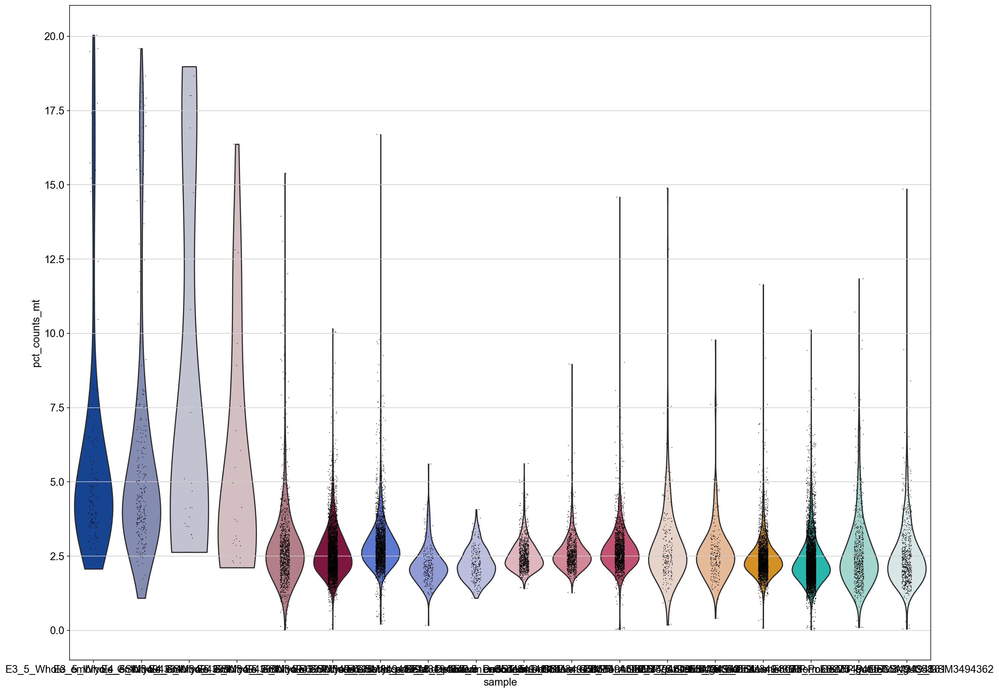

In [198]:
t1 = sc.pl.violin(adata_dp_5, 'total_counts', groupby='sample', size=2, log=True, cut=0,save='_dp_final_umi_counts.png')
t2 = sc.pl.violin(adata_dp_5, 'n_genes_by_counts', groupby='sample', size=2, log=True, cut=0,save='_dp_final_genes.png')
t3 = sc.pl.violin(adata_dp_5, 'pct_counts_mt', groupby='sample',save='_dp_final_mt_counts.png')

# get the pharynx atlas in 

- read pharynx raw data, filter out cells s.t. only 54044 cells remain

### read pharynx atlas object ( from Magaletta et al 2022 )

In [233]:
adata_pa = sc.read("../mouse_endoderm_roadmap/data/pharynx_atlas/whole_atlas_filtered.loom.h5ad")

In [234]:
adata_pa.X = adata_pa.layers['raw']

#### read count matrices for this object to get ensembl IDs

In [220]:
base_dir = "../tenX/CR_pharynx/" 
# redo is the CellRanger mkfastq, pax9 is the illumia bcltofastq
ext_dir = "/outs/filtered_gene_bc_matrices/mm10/"

In [212]:
samples = [entry for entry in os.listdir(base_dir) if entry != '.DS_Store' and entry[0] == 'E']

In [215]:
samples.sort()
samples

['E10_5_rep1_2018FEB09',
 'E10_5_rep2_2018FEB09',
 'E10_5_rep3_2018JUNE28',
 'E10_5_rep4_2018JUNE26',
 'E10_5_rep5_2018AUG16',
 'E10_5_rep6_2018SEP22',
 'E10_5_rep7_2018AUG16',
 'E11_5_rep2B_2018JULY27',
 'E11_5_rep2_2018JUNE26',
 'E11_5_rep3_2018SEP22',
 'E12_5_rep1_2018JUNE28',
 'E12_5_rep2_2018JUNE28',
 'E9_5_rep1_2018JULY18',
 'E9_5_rep2_2018AUG07']

In [214]:
len(samples)

14

In [216]:
# only keep 10.5 reps 5,6,7 ( as in the manuscript )
samples_new = []
for entry in samples:
    if entry[0:5] == 'E10_5' and entry not in ['E10_5_rep5_2018AUG16','E10_5_rep6_2018SEP22','E10_5_rep7_2018AUG16']:
        continue
    else:
        samples_new.append(entry)

In [218]:
samples_new.sort()
samples_new

['E10_5_rep5_2018AUG16',
 'E10_5_rep6_2018SEP22',
 'E10_5_rep7_2018AUG16',
 'E11_5_rep2B_2018JULY27',
 'E11_5_rep2_2018JUNE26',
 'E11_5_rep3_2018SEP22',
 'E12_5_rep1_2018JUNE28',
 'E12_5_rep2_2018JUNE28',
 'E9_5_rep1_2018JULY18',
 'E9_5_rep2_2018AUG07']

In [222]:
adata = {}
for entry in samples_new:
    print(entry)
    adata[entry] = load_scRNA(base_dir + entry + ext_dir, entry)

E10_5_rep5_2018AUG16
... reading from cache file cache/Users-LoboM-Dropbox-shared_Bioinformatics-tenX-CR_redo_pharynx-E10_5_rep5_2018AUG16-outs-filtered_gene_bc_matrices-mm10-matrix.h5ad
E10_5_rep6_2018SEP22
... reading from cache file cache/Users-LoboM-Dropbox-shared_Bioinformatics-tenX-CR_redo_pharynx-E10_5_rep6_2018SEP22-outs-filtered_gene_bc_matrices-mm10-matrix.h5ad
E10_5_rep7_2018AUG16
... reading from cache file cache/Users-LoboM-Dropbox-shared_Bioinformatics-tenX-CR_redo_pharynx-E10_5_rep7_2018AUG16-outs-filtered_gene_bc_matrices-mm10-matrix.h5ad
E11_5_rep2B_2018JULY27
... reading from cache file cache/Users-LoboM-Dropbox-shared_Bioinformatics-tenX-CR_redo_pharynx-E11_5_rep2B_2018JULY27-outs-filtered_gene_bc_matrices-mm10-matrix.h5ad
E11_5_rep2_2018JUNE26
... reading from cache file cache/Users-LoboM-Dropbox-shared_Bioinformatics-tenX-CR_redo_pharynx-E11_5_rep2_2018JUNE26-outs-filtered_gene_bc_matrices-mm10-matrix.h5ad
E11_5_rep3_2018SEP22
... reading from cache file cache/User

In [223]:
adata

{'E10_5_rep5_2018AUG16': AnnData object with n_obs × n_vars = 5045 × 27998
     obs: 'sample'
     var: 'gene_ids',
 'E10_5_rep6_2018SEP22': AnnData object with n_obs × n_vars = 4324 × 27998
     obs: 'sample'
     var: 'gene_ids',
 'E10_5_rep7_2018AUG16': AnnData object with n_obs × n_vars = 4382 × 27998
     obs: 'sample'
     var: 'gene_ids',
 'E11_5_rep2B_2018JULY27': AnnData object with n_obs × n_vars = 3268 × 27998
     obs: 'sample'
     var: 'gene_ids',
 'E11_5_rep2_2018JUNE26': AnnData object with n_obs × n_vars = 5878 × 27998
     obs: 'sample'
     var: 'gene_ids',
 'E11_5_rep3_2018SEP22': AnnData object with n_obs × n_vars = 9413 × 27998
     obs: 'sample'
     var: 'gene_ids',
 'E12_5_rep1_2018JUNE28': AnnData object with n_obs × n_vars = 5146 × 27998
     obs: 'sample'
     var: 'gene_ids',
 'E12_5_rep2_2018JUNE28': AnnData object with n_obs × n_vars = 6733 × 27998
     obs: 'sample'
     var: 'gene_ids',
 'E9_5_rep1_2018JULY18': AnnData object with n_obs × n_vars = 5901 

In [225]:
adata_pa

AnnData object with n_obs × n_vars = 54044 × 27998
    obs: 'orig.ident', 'eday', 'nGene', 'nUMI', 'preliminary_ident', 'Phase', 'included', 'louvain'
    var: 'gene.dispersion', 'gene.dispersion.scaled', 'gene.mean'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    layers: 'raw'

In [232]:
for entry in adata_pa.var_names:
    if 'mt.' in entry:
        print(entry)

mt.Nd1
mt.Nd2
mt.Co1
mt.Co2
mt.Atp8
mt.Atp6
mt.Co3
mt.Nd3
mt.Nd4l
mt.Nd4
mt.Nd5
mt.Nd6
mt.Cytb


In [236]:
adata_pa.var['mt'] = adata_pa.var_names.str.startswith('mt.')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_pa, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

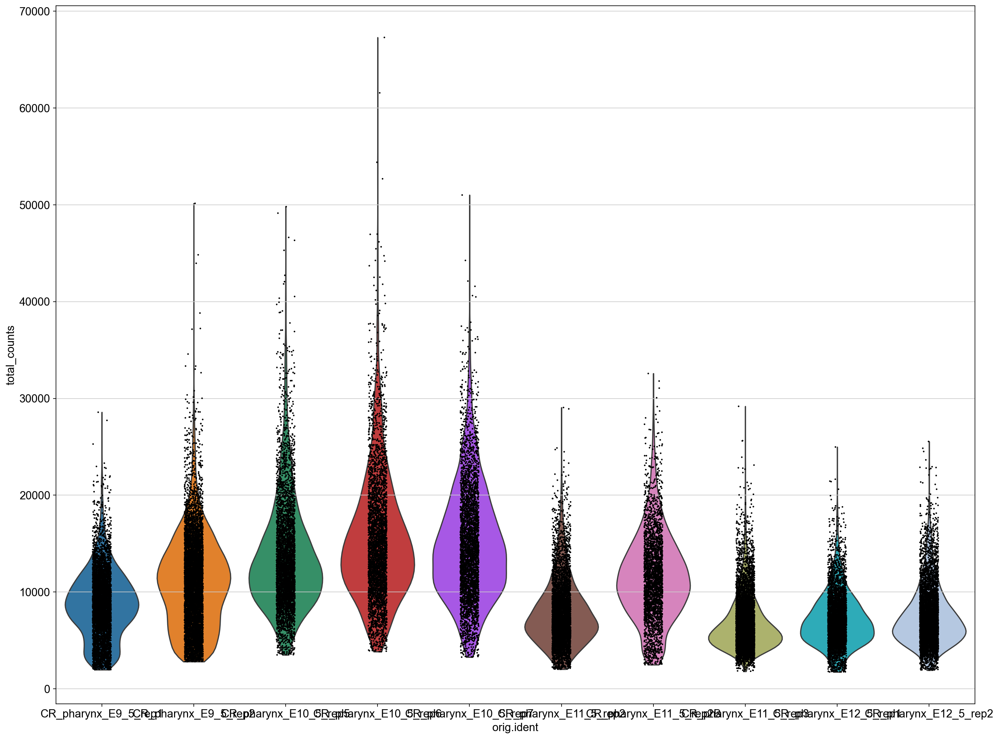

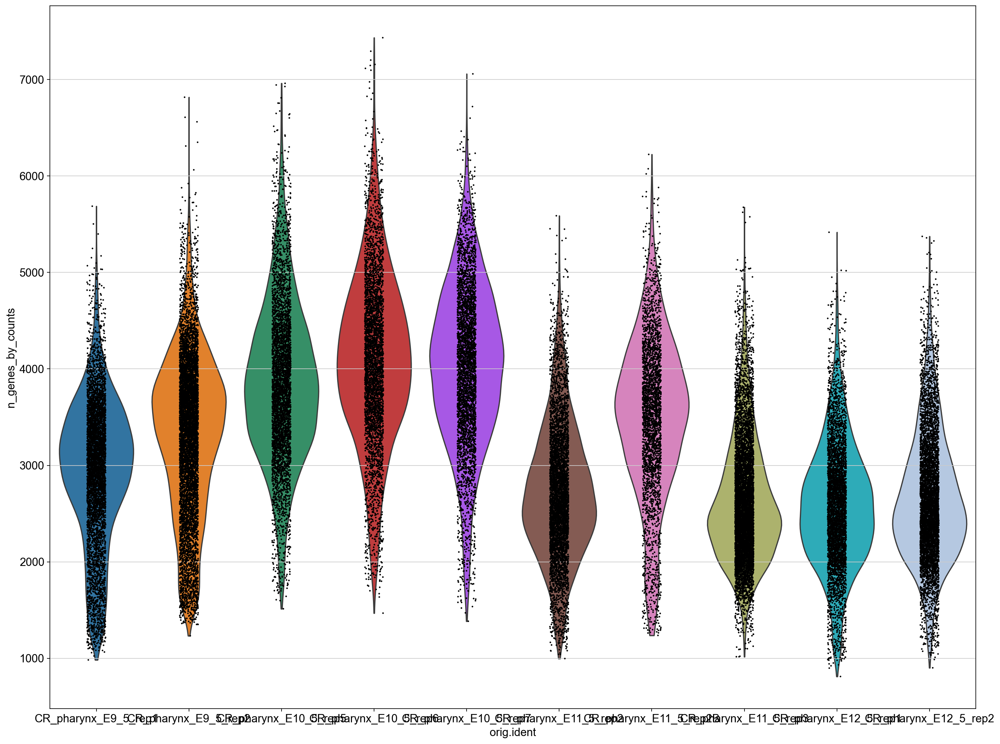

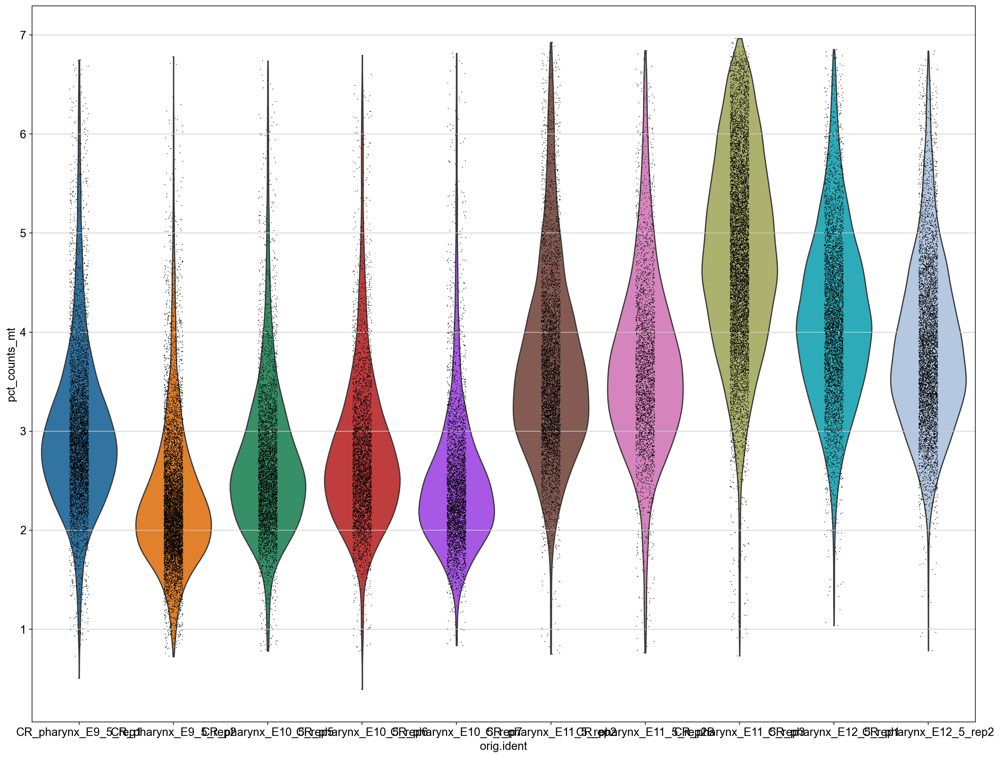

In [237]:
t1 = sc.pl.violin(adata_pa, 'total_counts', groupby='orig.ident', size=2,  cut=0,save='_pa_umi_counts.png')
t2 = sc.pl.violin(adata_pa, 'n_genes_by_counts', groupby='orig.ident', size=2,cut=0,save='_pa_genes.png')
t3 = sc.pl.violin(adata_pa, 'pct_counts_mt', groupby='orig.ident',save='_pa_mt_counts.png')

In [238]:
adata_pa.write("../data/pharynx_atlas_FINAL_OBJ.h5ad")

- add all_day variable, 
- fix problem with '.' '-' in gene names 
- make sure all pharynx atlas genes are in dp object 
- merge

 - add all day

In [240]:
adata_pa.obs['all_day'] = ['E' + str(entry) for entry in adata_pa.obs['eday'].values]

In [241]:
adata_dp_5.obs['all_day'] = adata_dp_5.obs['Timepoint']

Trying to set attribute `.obs` of view, copying.


#### Gene name fixes prior to integration
    - '.' / '-'
    - Ensembl ID
    - inner join

- add ensembl to adata_pa
- sum genes with same ensembl-id for adata_pa and adata_dp_5 (not required verified that ens_id is unique)
- make var index the ensembl id, find set difference. merge the datasets


In [307]:
pa_genes = []
for entry in adata['E10_5_rep5_2018AUG16'].var_names:
    entry = entry.replace('-','.').replace('(','.').replace(')','.')
    if entry[0] in [str(idx) for idx in range(10)]:
        entry = 'X' + entry
    pa_genes.append(entry)

In [308]:
# get ensembl ids for pharynx atlas genes 
ens_id = []
for entry in adata_pa.var_names:
    rchd = 0
    for entry2 in range(len(pa_genes)):
        if pa_genes[entry2] == entry:
            ens_id.append(list(adata['E10_5_rep5_2018AUG16'][:,adata['E10_5_rep5_2018AUG16'].var_names[entry2]].var['gene_ids'])[0])
            rchd = 1
            break
    if rchd == 0:
        print(entry)

In [320]:
# verify only 1 ens_id per gene
# ens_id = []
for entry in adata_pa.var_names:
    rchd = 0
    for entry2 in range(len(pa_genes)): 
        if pa_genes[entry2] == entry:
            tmp = list(adata['E10_5_rep5_2018AUG16'][:,adata['E10_5_rep5_2018AUG16'].var_names[entry2]].var['gene_ids'])
            if len(tmp) > 1:
                print(tmp)
            rchd = 1
            break
    if rchd == 0:
        print(entry)

In [329]:
adata_pa.var['gene_ids'] = ens_id

- reindex with ens ID

In [341]:
adata_pa_ens = anndata.AnnData(X=adata_pa.X,obs=adata_pa.obs,var=pd.DataFrame(adata_pa.var).reset_index().set_index('gene_ids').rename(columns = {'index':'gene_name'}) )

In [344]:
adata_dp_5_ens = anndata.AnnData(X=adata_dp_5.X,obs=adata_dp_5.obs,var=pd.DataFrame(adata_dp_5.var).reset_index().set_index('gene_ids').rename(columns = {'index':'gene_name'}) )

In [349]:
adata_pa_ens

AnnData object with n_obs × n_vars = 54044 × 27998
    obs: 'orig.ident', 'eday', 'nGene', 'nUMI', 'preliminary_ident', 'Phase', 'included', 'louvain', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'all_day'
    var: 'gene_name', 'gene.dispersion', 'gene.dispersion.scaled', 'gene.mean', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [350]:
adata_dp_5_ens

AnnData object with n_obs × n_vars = 23231 × 31053
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'dp_info', 'Timepoint', 'CellType', 'Cluster', 'in_online_obj', 'old_name', 'all_day'
    var: 'gene_name', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

- after merge reset the gene names

In [379]:
adata_all = adata_dp_5_ens.concatenate(adata_pa_ens, batch_key='lab',batch_categories=['peer','maehr'])

- reset to peer gene name

In [386]:
adata_all_var = pd.DataFrame(adata_all.var).reset_index().set_index('gene_name-peer').rename(columns = {'index':'gene_ids'})

In [390]:
adata_all_var.index.name = None

In [392]:
adata_all_final = anndata.AnnData(X=adata_all.X,obs=adata_all.obs,var=adata_all_var)

In [394]:
adata_all_final.write("../data/merged_pre_qc_filt_FINAL.h5ad")

... storing 'sample' as categorical
... storing 'dp_info' as categorical
... storing 'Timepoint' as categorical
... storing 'CellType' as categorical
... storing 'Cluster' as categorical
... storing 'old_name' as categorical
... storing 'all_day' as categorical
... storing 'orig.ident' as categorical
... storing 'preliminary_ident' as categorical
... storing 'Phase' as categorical
... storing 'included' as categorical
... storing 'louvain' as categorical


In [396]:
adata_all_final.var['mt'] = adata_all_final.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_all_final,  percent_top=None, log1p=False, inplace=True)

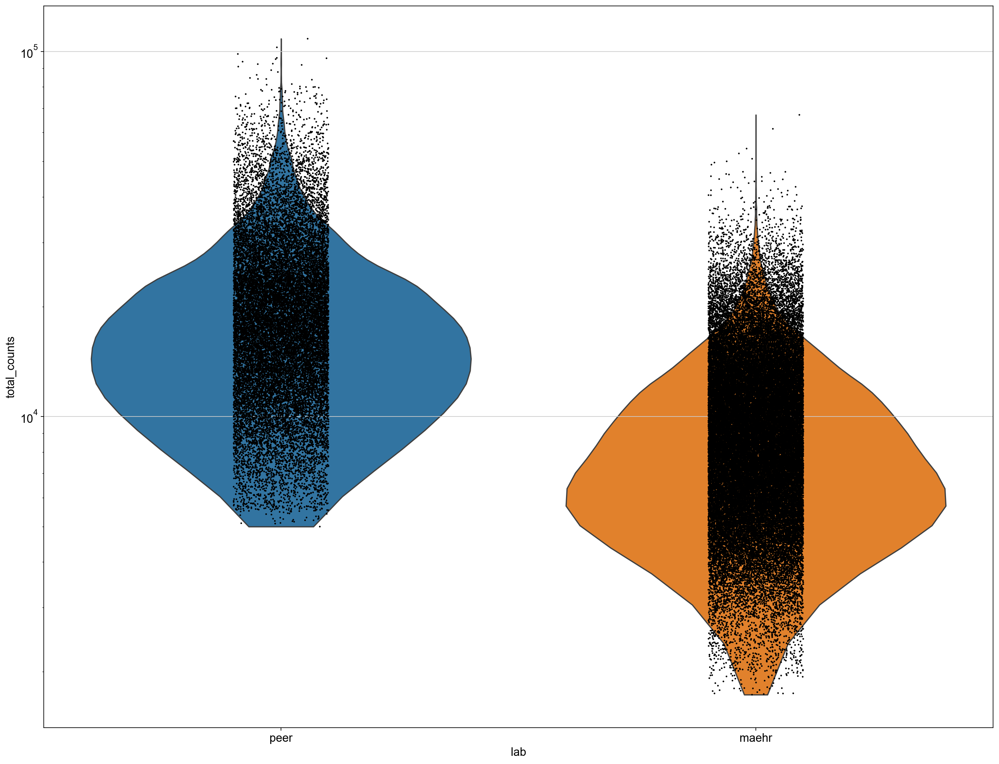

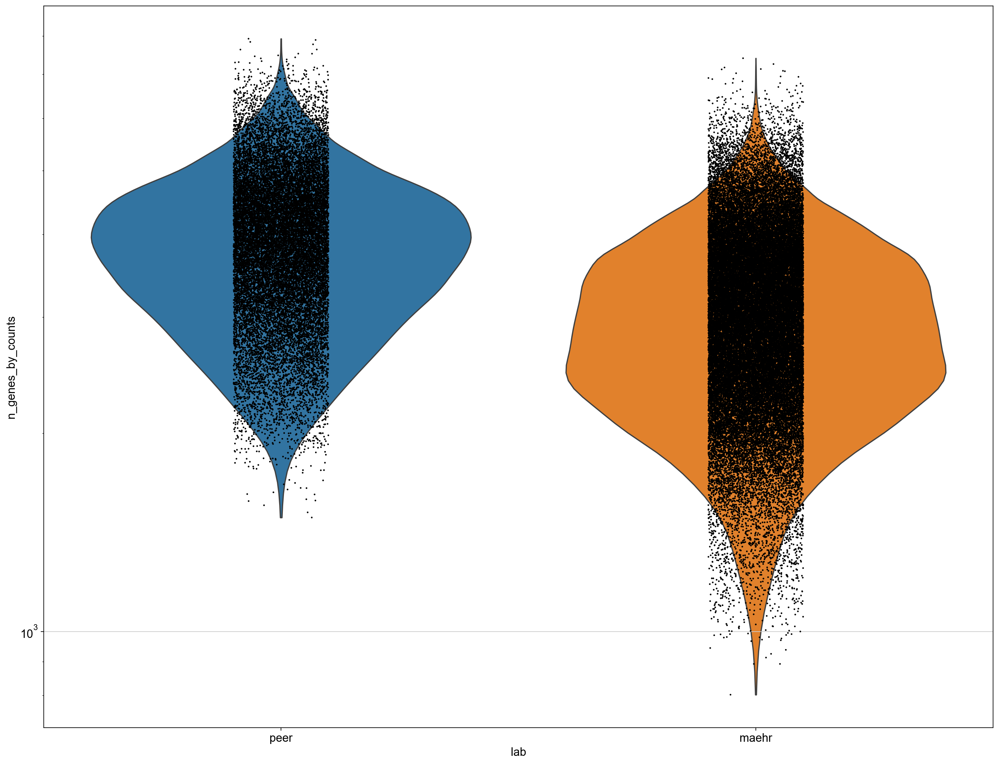

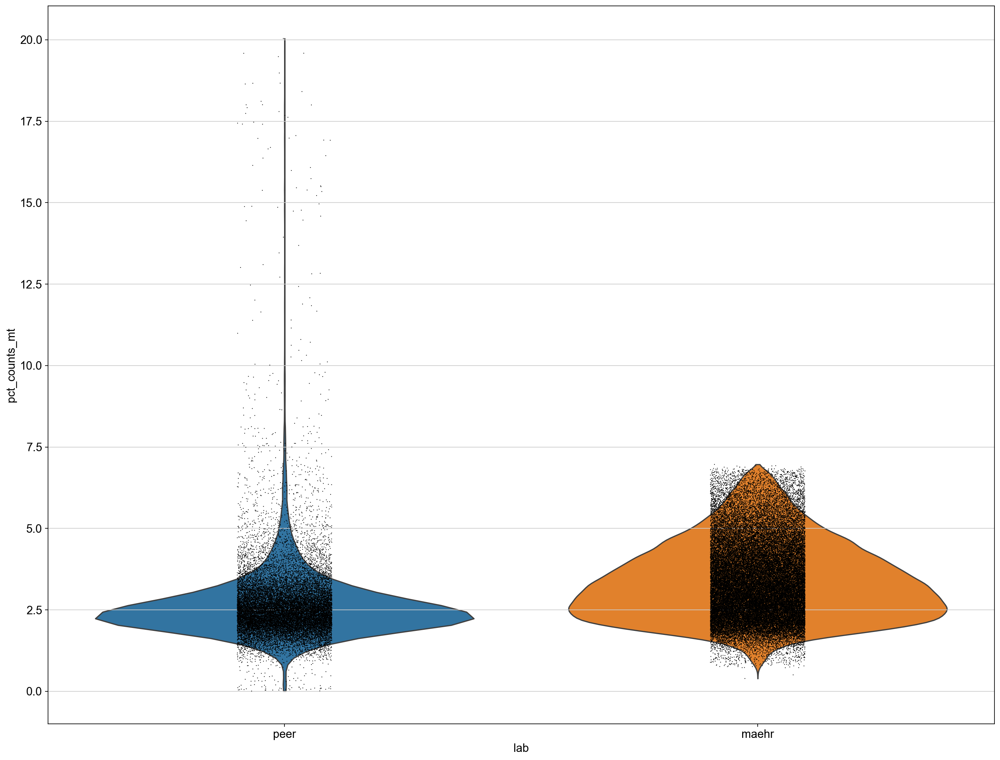

In [398]:
# didnt run
t1 = sc.pl.violin(adata_all_final, 'total_counts', groupby='lab', size=2, log=True, cut=0,save='_merged_umi_counts.png')
t2 = sc.pl.violin(adata_all_final, 'n_genes_by_counts', groupby='lab', size=2, log=True, cut=0,save='_merged_genes.png')
t3 = sc.pl.violin(adata_all_final, 'pct_counts_mt', groupby='lab',save='_merged_mt_counts.png')

### DOWNSTREAM PROCESSING

In [399]:
sc.pp.filter_genes(adata_all_final, min_cells=3)

filtered out 5608 genes that are detected in less than 3 cells


In [402]:
adata_all_final.write("../data/merged_post_gene_filt_FINAL.h5ad")